# Predicting whether a song was released before the 2000s

# Imports

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import tree, svm
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler, LabelBinarizer
from sklearn.model_selection import learning_curve
from sklearn.model_selection import ShuffleSplit
from statistics import mean
scaler = MinMaxScaler()
lb = LabelBinarizer()


Bad key savefig.frameon in file C:\Users\Raj\Anaconda2\envs\py3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle, line 421 ('savefig.frameon : True')
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.3.2/matplotlibrc.template
or from the matplotlib source distribution

Bad key verbose.level in file C:\Users\Raj\Anaconda2\envs\py3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle, line 472 ('verbose.level  : silent      # one of silent, helpful, debug, debug-annoying')
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.3.2/matplotlibrc.template
or from the matplotlib source distribution

Bad key verbose.fileo in file C:\Users\Raj\Anaconda2\envs\py3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle, line 473 ('verbose.fileo  : sys.stdout  # a log filename, sys.stdout or sys.stderr')
You probably need to get an upd

# Load data

In [2]:
# Load data
df= pd.read_csv('./spotifydata/data.csv')

# Show info and description of dataset
df.info()
df.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 174389 entries, 0 to 174388
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   acousticness      174389 non-null  float64
 1   artists           174389 non-null  object 
 2   danceability      174389 non-null  float64
 3   duration_ms       174389 non-null  int64  
 4   energy            174389 non-null  float64
 5   explicit          174389 non-null  int64  
 6   id                174389 non-null  object 
 7   instrumentalness  174389 non-null  float64
 8   key               174389 non-null  int64  
 9   liveness          174389 non-null  float64
 10  loudness          174389 non-null  float64
 11  mode              174389 non-null  int64  
 12  name              174389 non-null  object 
 13  popularity        174389 non-null  int64  
 14  release_date      174389 non-null  object 
 15  speechiness       174389 non-null  float64
 16  tempo             17

,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo,valence,year
count,174389.000000,174389.000000,1.743890e+05,174389.000000,174389.000000,174389.000000,174389.000000,174389.000000,174389.000000,174389.000000,174389.000000,174389.000000,174389.000000,174389.000000,174389.000000
mean,0.499228,0.536758,2.328100e+05,0.482721,0.068135,0.197252,5.205305,0.211123,-11.750865,0.702384,25.693381,0.105729,117.006500,0.524533,1977.061764
std,0.379936,0.176025,1.483958e+05,0.272685,0.251978,0.334574,3.518292,0.180493,5.691591,0.457211,21.872740,0.182260,30.254178,0.264477,26.907950
min,0.000000,0.000000,4.937000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1920.000000
25%,0.087700,0.414000,1.661330e+05,0.249000,0.000000,0.000000,2.000000,0.099200,-14.908000,0.000000,1.000000,0.035200,93.931000,0.311000,1955.000000
50%,0.517000,0.548000,2.057870e+05,0.465000,0.000000,0.000524,5.000000,0.138000,-10.836000,1.000000,25.000000,0.045500,115.816000,0.536000,1977.000000
75%,0.895000,0.669000,2.657200e+05,0.711000,0.000000,0.252000,8.000000,0.270000,-7.499000,1.000000,42.000000,0.076300,135.011000,0.743000,1999.000000
max,0.996000,0.988000,5.338302e+06,1.000000,1.000000,1.000000,11.000000,1.000000,3.855000,1.000000,100.000000,0.971000,243.507000,1.000000,2021.000000


In [3]:
# Modified from https://scikit-learn.org/stable/auto_examples/model_selection/plot_learning_curve.html

# 5 fold validation => 80% training, 20% tests
def plot_learning_curve(estimator, title, X, y, axes=None, ylim=None, cv=None,
                        n_jobs=None, train_sizes=np.linspace(.1, 1.0, 5)):
    """
    Generate 3 plots: the test and training learning curve, the training
    samples vs fit times curve, the fit times vs score curve.

        """
    if axes is None:
        _, axes = plt.subplots(1, 3, figsize=(20, 5))

    axes[0].set_title(title)
    if ylim is not None:
        axes[0].set_ylim(*ylim)
    axes[0].set_xlabel("Training examples")
    axes[0].set_ylabel("Score")

    train_sizes, train_scores, test_scores, fit_times, _ = \
        learning_curve(estimator, X, y, cv=cv, n_jobs=n_jobs,
                       train_sizes=train_sizes,
                       return_times=True,
                       scoring='accuracy'
                       )
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    fit_times_mean = np.mean(fit_times, axis=1)
    fit_times_std = np.std(fit_times, axis=1)

    # Plot learning curve
    axes[0].grid()
    axes[0].fill_between(train_sizes, train_scores_mean - train_scores_std,
                         train_scores_mean + train_scores_std, alpha=0.1,
                         color="r")
    axes[0].fill_between(train_sizes, test_scores_mean - test_scores_std,
                         test_scores_mean + test_scores_std, alpha=0.1,
                         color="g")
    axes[0].plot(train_sizes, train_scores_mean, 'o-', color="r",
                 label="Training score")
    axes[0].plot(train_sizes, test_scores_mean, 'o-', color="g",
                 label="Testing score")
    axes[0].legend(loc="best")

    # Plot n_samples vs fit_times
    axes[1].grid()
    axes[1].plot(train_sizes, fit_times_mean, 'o-')
    axes[1].fill_between(train_sizes, fit_times_mean - fit_times_std,
                         fit_times_mean + fit_times_std, alpha=0.1)
    axes[1].set_xlabel("Training examples")
    axes[1].set_ylabel("fit_times")
    axes[1].set_title("Scalability of the model")

    # Plot fit_time vs score
    axes[2].grid()
    axes[2].plot(fit_times_mean, test_scores_mean, 'o-')
    axes[2].fill_between(fit_times_mean, test_scores_mean - test_scores_std,
                         test_scores_mean + test_scores_std, alpha=0.1)
    axes[2].set_xlabel("fit_times")
    axes[2].set_ylabel("Score")
    axes[2].set_title("Performance of the model")

    return plt

In [4]:
# Set column id as index
df.set_index('id', inplace=True)

# Show updated dataframe
df.head(5)


,acousticness,artists,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,valence,year
id,,,,,,,,,,,,,,,,,,
0cS0A1fUEUd1EW3FcF8AEI,0.991000,['Mamie Smith'],0.598,168333,0.224,0,0.000522,5,0.3790,-12.628,0,Keep A Song In Your Soul,12,1920,0.0936,149.976,0.6340,1920
0hbkKFIJm7Z05H8Zl9w30f,0.643000,"[""Screamin' Jay Hawkins""]",0.852,150200,0.517,0,0.026400,5,0.0809,-7.261,0,I Put A Spell On You,7,1920-01-05,0.0534,86.889,0.9500,1920
11m7laMUgmOKqI3oYzuhne,0.993000,['Mamie Smith'],0.647,163827,0.186,0,0.000018,0,0.5190,-12.098,1,Golfing Papa,4,1920,0.1740,97.600,0.6890,1920
19Lc5SfJJ5O1oaxY0fpwfh,0.000173,['Oscar Velazquez'],0.730,422087,0.798,0,0.801000,2,0.1280,-7.311,1,True House Music - Xavier Santos & Carlos Gomi...,17,1920-01-01,0.0425,127.997,0.0422,1920
2hJjbsLCytGsnAHfdsLejp,0.295000,['Mixe'],0.704,165224,0.707,1,0.000246,10,0.4020,-6.036,0,Xuniverxe,2,1920-10-01,0.0768,122.076,0.2990,1920


# Prep for training and drop any non-relevant columns

In [5]:
filtered_df = df.copy()
filtered_df['year'] = filtered_df['year'].apply(lambda year: 0 if year < 2000 else 1)
filtered_df = filtered_df.drop(['name', 'artists', 'release_date'], axis=1)

# Duration Data Analysis
The histogram of the data indicates that the data is closely distributed thus any feature scaling should represent that. The min max scaler works well with data such as this.

<AxesSubplot:ylabel='Frequency'>

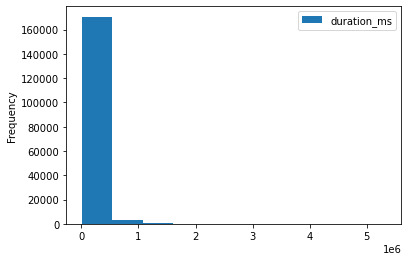

In [6]:
filtered_df['duration_ms'].plot.hist(by='duration_ms', legend='true')

# Trial 1: Without Feature Scaling

In [7]:
X = filtered_df.loc[:, filtered_df.columns != 'year']
Y = filtered_df['year']

filtered_df.head(5)

,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo,valence,year
id,,,,,,,,,,,,,,,
0cS0A1fUEUd1EW3FcF8AEI,0.991000,0.598,168333,0.224,0,0.000522,5,0.3790,-12.628,0,12,0.0936,149.976,0.6340,0
0hbkKFIJm7Z05H8Zl9w30f,0.643000,0.852,150200,0.517,0,0.026400,5,0.0809,-7.261,0,7,0.0534,86.889,0.9500,0
11m7laMUgmOKqI3oYzuhne,0.993000,0.647,163827,0.186,0,0.000018,0,0.5190,-12.098,1,4,0.1740,97.600,0.6890,0
19Lc5SfJJ5O1oaxY0fpwfh,0.000173,0.730,422087,0.798,0,0.801000,2,0.1280,-7.311,1,17,0.0425,127.997,0.0422,0
2hJjbsLCytGsnAHfdsLejp,0.295000,0.704,165224,0.707,1,0.000246,10,0.4020,-6.036,0,2,0.0768,122.076,0.2990,0


In [13]:
print(sum(Y))
print(sum(Y)/len(Y))

42371
0.2429683064872211


# Trial 2: With Feature Scaling

In [29]:
# Feature scaling
filtered_scaled_df = filtered_df.copy()
filtered_scaled_df[['duration_ms', 'popularity', 'tempo', 'loudness']] = scaler.fit_transform(filtered_scaled_df[['duration_ms', 'popularity', 'tempo', 'loudness']])

# One hot encoding
encoded_df = pd.DataFrame( lb.fit_transform(filtered_scaled_df['key']) )
filtered_scaled_df = filtered_scaled_df.reset_index()
filtered_scaled_df = pd.concat([filtered_scaled_df,  encoded_df], axis=1)
filtered_scaled_df = filtered_scaled_df.drop(['key'], axis=1)
filtered_scaled_df.set_index('id', inplace=True)

X = filtered_scaled_df.loc[:, filtered_scaled_df.columns != 'year']
Y = filtered_scaled_df['year']

filtered_scaled_df.head(5)

,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,liveness,loudness,mode,popularity,...,2,3,4,5,6,7,8,9,10,11
id,,,,,,,,,,,,,,,,,,,,,
0cS0A1fUEUd1EW3FcF8AEI,0.991000,0.598,0.030637,0.224,0,0.000522,0.3790,0.741868,0,0.12,...,0,0,0,1,0,0,0,0,0,0
0hbkKFIJm7Z05H8Zl9w30f,0.643000,0.852,0.027237,0.517,0,0.026400,0.0809,0.825918,0,0.07,...,0,0,0,1,0,0,0,0,0,0
11m7laMUgmOKqI3oYzuhne,0.993000,0.647,0.029792,0.186,0,0.000018,0.5190,0.750168,1,0.04,...,0,0,0,0,0,0,0,0,0,0
19Lc5SfJJ5O1oaxY0fpwfh,0.000173,0.730,0.078215,0.798,0,0.801000,0.1280,0.825135,1,0.17,...,1,0,0,0,0,0,0,0,0,0
2hJjbsLCytGsnAHfdsLejp,0.295000,0.704,0.030054,0.707,1,0.000246,0.4020,0.845102,0,0.02,...,0,0,0,0,0,0,0,0,1,0


# Train-Test Split ( 60% Train // 40% Test )

In [9]:
X_train, X_test, Y_train, Y_test = train_test_split(
X, Y, test_size=0.4, random_state=0)


In [30]:
# Decision Tree Regressor
# ccp_alpha=0.00001
clf = tree.DecisionTreeRegressor(ccp_alpha=0.00001)



In [165]:
# Neural Network Regressor
clf = MLPRegressor(hidden_layer_sizes=(150,100,50), max_iter=300,activation = 'logistic',solver='adam',random_state=1)


In [219]:
# Ensemble Tree Regressor
clf = GradientBoostingRegressor(n_estimators=100, learning_rate=1.0,
    max_depth=1, random_state=0, ccp_alpha=0.000001)

In [177]:
# Support Vector Machine Regressor
clf = svm.SVC()

In [16]:
# Nearest Neighbor Regressor
clf = KNeighborsRegressor(n_neighbors=9)

In [32]:
clf.fit(X_train, Y_train)

DecisionTreeRegressor(ccp_alpha=1e-05)

In [18]:
clf.score(X_test,Y_test)

0.747111930594202

# Results With No Feature Scaling 

## Decision tree test score: 0.8712225471644016

## Decision tree test score w/ ccp_alpha (pruning):
                                      0.003 : 0.8754515740581456
                                      0.001 : 0.8805407420150237
                                      0.0003 : 0.8905040426629968
                                      0.00001: 0.8954785251447904
                                      0.00001 : 0.8777452835598372

## Neural Network: `0.7561356729170251`
##### (hidden_layer_sizes=(150,100,50), max_iter=300,activation = 'relu',solver='adam',random_state=1)
##### No difference using logistic for activation

## Decision tree (boosted): `0.8876942485234245`

## Decision tree w/ ccp_alpha (boosted/pruning):  
                                       0.003 : 0.836429841160617
                                       0.001 : 0.8616319743104536
                                       0.0003 : 0.8739033201445037
                                       0.0001 : 0.8820316531911233
                                       0.00003 : 0.8856012386031309
                                       0.00001 : 0.8876942485234245
                                       0.000001 : 0.8876942485234245
                                       

## Support Vector Machine: `0.7564510579735076`

## KNN 
     w/ 3 neighbors: 0.768177647800906
     w/ 5 neighbors: 0.7700269510866449
     w/ 7 neighbors: 1.0
     w/ 9 neighbors: 1.0


In [21]:
result_values = [0.8712225471644016, 0.8754515740581456, 0.8805407420150237, 0.8905040426629968, 0.8954785251447904, 0.8777452835598372, 0.7561356729170251, 0.8876942485234245, 0.836429841160617, 0.8616319743104536, 0.8739033201445037,0.8820316531911233, 0.8856012386031309, 0.8876942485234245, 0.8876942485234245, 0.7564510579735076, 0.768177647800906, 0.7700269510866449, 1.0, 1.0 ]
non_feature_scaled_average = mean(result_values)
non_feature_scaled_average

0.867220740868169

==================================================================================================================================

# Results With Feature Scaling 

## Decision tree test score: 0.8703193990481105

## Decision tree test score w/ ccp_alpha (pruning):
                                      0.003 : 0.8754515740581456
                                      0.001 : 0.8805407420150237
                                      0.0003 :0.8905040426629968
                                      0.0001 : 0.8954785251447904
                                      0.00001 : 0.876641435862148

## Neural Network: 0.9068753942313206
##### (hidden_layer_sizes=(150,100,50), max_iter=300,activation = 'relu',solver='adam',random_state=1)
##### No difference using logistic for activation

## Decision tree (boosted): 0.887780262629738

## Decision tree w/ ccp_alpha (boosted/pruning):  
                                       0.003 : 0.887780262629738
                                       0.001 : 0.8616319743104536
                                       0.0003 : 0.8739033201445037
                                       0.0001 : 0.8820316531911233
                                       0.00003 : 0.8856012386031309
                                       0.00001 : 0.887780262629738
                                       0.000001 : 0.887780262629738
                                       

## Support Vector Machine: 0.8901456505533574

## KNN 
     w/ 3 neighbors: 0.8705917770514364
     w/ 5 neighbors: 0.8748351396295659
     w/ 7 neighbors: 0.8756522736395436
     w/ 9 neighbors: 0.8747347898388669

In [28]:
result_values_scaled = [0.8703193990481105, 0.8754515740581456, 0.8805407420150237, 0.8905040426629968, 0.8954785251447904, 0.876641435862148,0.9068753942313206, 0.887780262629738, 0.887780262629738, 0.8616319743104536, 0.8739033201445037, 0.8820316531911233, 0.8856012386031309, 0.887780262629738, 0.887780262629738, 0.8901456505533574, 0.8705917770514364, 0.8748351396295659, 0.8756522736395436, 0.8747347898388669]
feature_scaled_average = mean(result_values_scaled)
feature_scaled_average

0.8818029990251735

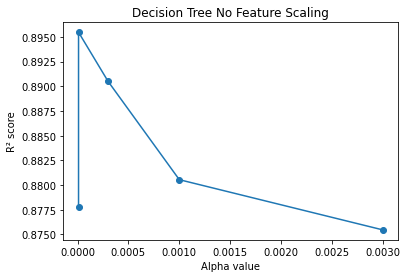

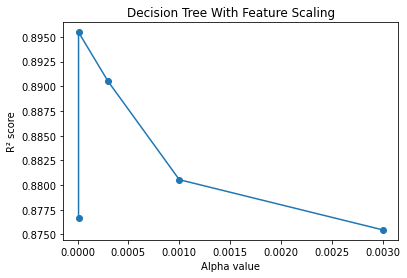

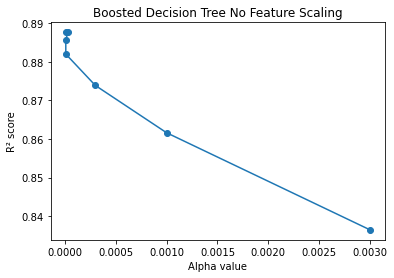

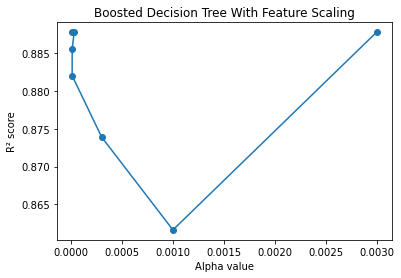

In [28]:
decision_tree_data_no_fs_x = [0.003, 0.001,  0.0003, 0.00001, 0.00001 ]
decision_tree_data_no_fs_y = [0.8754515740581456, 0.8805407420150237, 0.8905040426629968, 0.8954785251447904, 0.8777452835598372]
decision_tree_data_fs_x = [0.003, 0.001,  0.0003, 0.00001, 0.00001 ]
decision_tree_data_fs_y = [0.8754515740581456, 0.8805407420150237, 0.8905040426629968, 0.8954785251447904, 0.876641435862148]

boosted_decision_tree_data_no_fs_x =   [ 0.003, 0.001,  0.0003, 0.00001, 0.00001, 0.00003, 0.00001 ]
boosted_decision_tree_data_no_fs_y =   [ 0.836429841160617, 0.8616319743104536, 0.8739033201445037,0.8820316531911233, 0.8856012386031309, 0.8876942485234245, 0.8876942485234245]

boosted_decision_tree_data_fs_x =   [ 0.003, 0.001,  0.0003, 0.00001, 0.00001, 0.00003, 0.00001 ]
boosted_decision_tree_data_fs_y =   [ 0.887780262629738, 0.8616319743104536, 0.8739033201445037, 0.8820316531911233, 0.8856012386031309, 0.887780262629738, 0.887780262629738]

plt.plot(decision_tree_data_no_fs_x, decision_tree_data_no_fs_y, '-o')
plt.xlabel('Alpha value')
plt.ylabel('R\u00b2 score')
plt.title('Decision Tree No Feature Scaling')
plt.show()
plt.plot(decision_tree_data_fs_x, decision_tree_data_fs_y, '-o')
plt.xlabel('Alpha value')
plt.ylabel('R\u00b2 score')
plt.title('Decision Tree With Feature Scaling')
plt.show()
plt.plot(boosted_decision_tree_data_no_fs_x, boosted_decision_tree_data_no_fs_y, '-o')
plt.xlabel('Alpha value')
plt.ylabel('R\u00b2 score')
plt.title('Boosted Decision Tree No Feature Scaling')
plt.show()
plt.plot(boosted_decision_tree_data_fs_x, boosted_decision_tree_data_fs_y, '-o')
plt.xlabel('Alpha value')
plt.ylabel('R\u00b2 score')
plt.title('Boosted Decision Tree With Feature Scaling')
plt.show()

In [ ]:
 Knn_no_fs_ x = [3,5,7,9] 
 Knn_no_fs_y = [0.768177647800906, 0.7700269510866449, 1.0, 1.0]

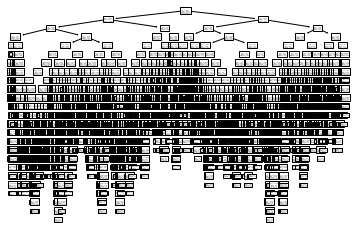

In [33]:

tree.plot_tree(clf)  
plt.show()

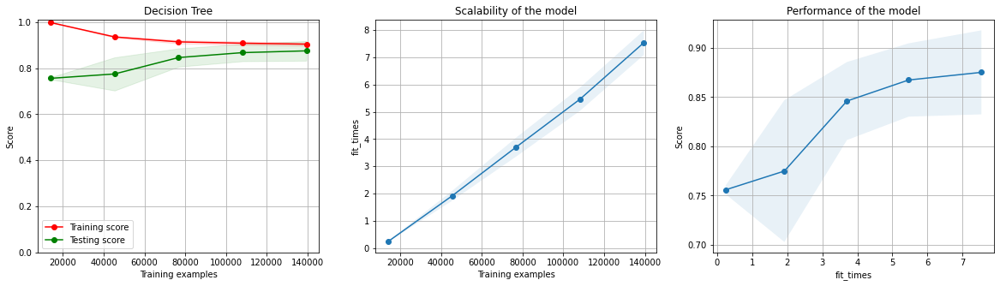

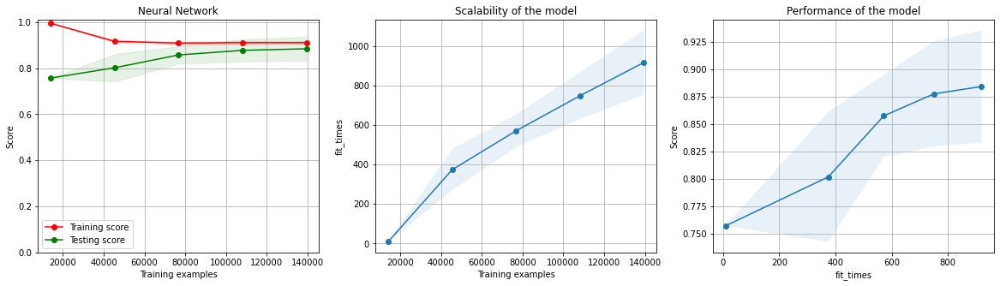

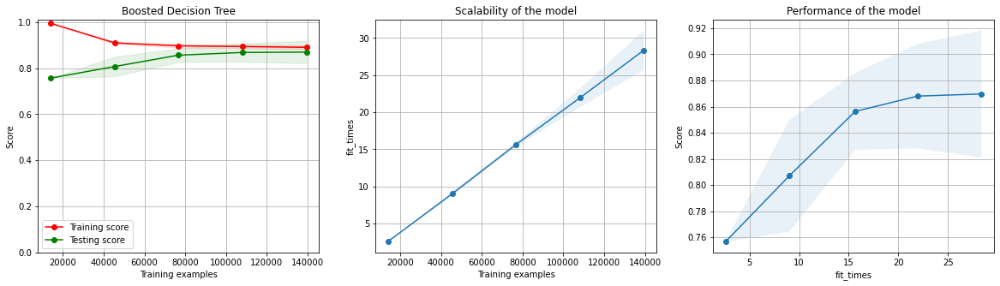

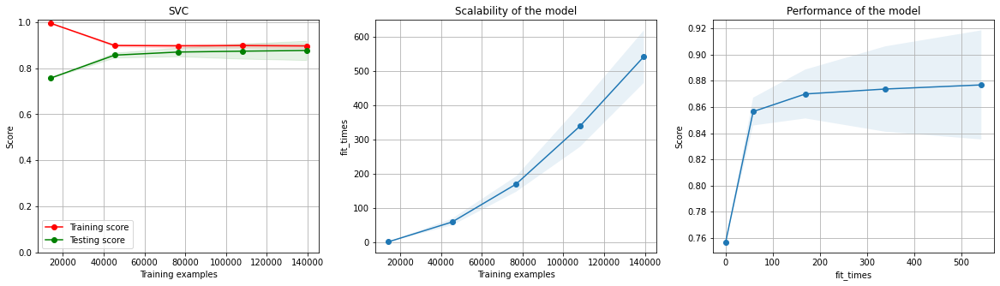

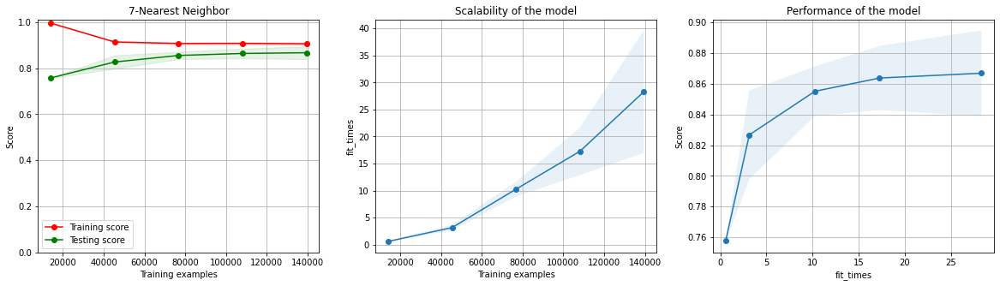

In [8]:
estimators = [
    [tree.DecisionTreeClassifier(ccp_alpha=0.0001), 'Decision Tree'],
    [MLPClassifier(hidden_layer_sizes=(150,100,50), activation = 'logistic',solver='adam',random_state=1), 'Neural Network'], 
    [GradientBoostingClassifier(n_estimators=100, learning_rate=1.0,
    max_depth=1, random_state=0, ccp_alpha=0.00001), 'Boosted Decision Tree'], 
    [svm.SVC(), 'SVC'], 
    [KNeighborsClassifier(n_neighbors=7), '7-Nearest Neighbor']
]
    

for estimator_data in estimators:
    plot_learning_curve(estimator_data[0], estimator_data[1], X, Y, ylim=(0, 1.01), n_jobs=4)
plt.show()


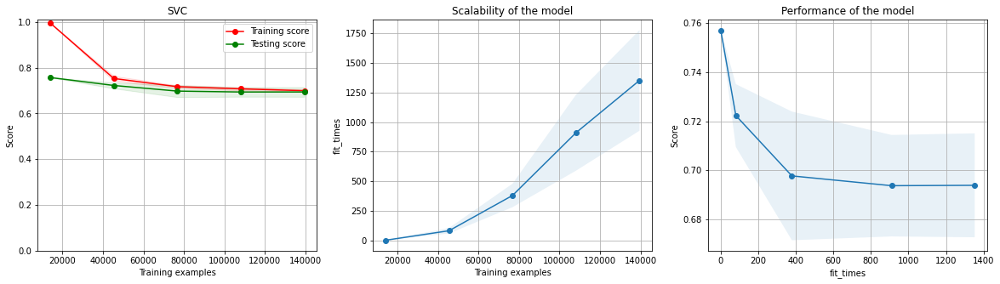

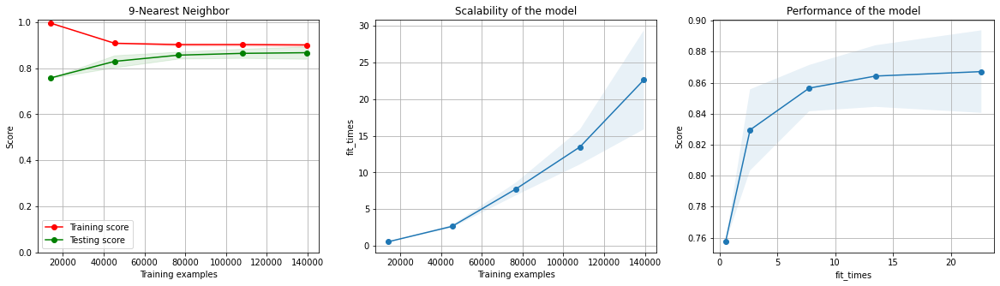

In [10]:
# Variations
estimators_modified = [
    [svm.SVC(kernel='sigmoid'), 'SVC'], 
    [KNeighborsClassifier(n_neighbors=9), '9-Nearest Neighbor']
]
    

for estimator_data in estimators_modified:
    plot_learning_curve(estimator_data[0], estimator_data[1], X, Y, ylim=(0, 1.01), n_jobs=4)
plt.show()

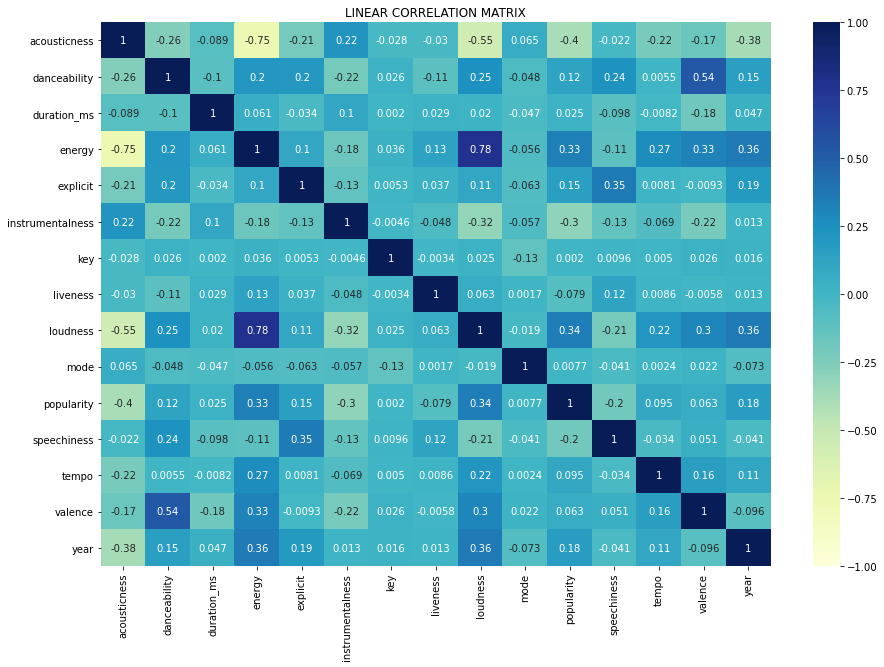

In [31]:
# Plot linear correlation matrix
fig, ax = plt.subplots(figsize=(15,10))
sns.heatmap(filtered_df.corr(), annot=True, cmap='YlGnBu', vmin=-1, vmax=1, center=0, ax=ax)
plt.title('LINEAR CORRELATION MATRIX')
plt.show()